# Gaussian Processes

In [1]:
%load_ext jupyter_black

## Reminder: parametric vs non-parametric methods 

**Parametric models:** data is generated from a parametrized family of distributions $\mathbb{P}_\theta$. **Training** is recovering parameters, **inference** is sampling. The expressiveness is restricted to number of paramters.

**Non-parametric models:** the same paramteric models, but number of params is growing with the size of training data. Inductive bayes is restricted to out prior, usually in terms of kernels. **Training** is saving all train data (probably, in some efficinet way), **inference** require all the train data.

## Gaussian Process Regression: motivation

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/gpr_animation_wide.gif?raw=1" width="1000"/>

**Stiochastic process** - is a **distribution over functions**, which is represented as a **distribution over finite samples**. This framework allows not only to make point prediction, but also tu quantify uncertainty under them.

**Gaussian process** - a stochastic process, whose finite samples follow the **Gaussian distribution**. By choosing specific kernel, we define the cocariance matrix. This GIF shows how the **sampled trajectories** from gaussian process with RBF kernel.

In [2]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

plt.rcParams["figure.dpi"] = 600
plt.rcParams["savefig.format"] = "pdf"
plt.rcParams["figure.figsize"] = (12, 6)

We have a random generated dataset $\mathbf{D}=[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$. We sampled the generated dataset and got a $1D$ Gaussian curve.

Now, if we project all points $[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$ on the x-axis to another **space**. In this space, We treat all points $[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$ as a vector $X_1$, and plot $X_1$ on the new $X$ axis at $X = 0$.

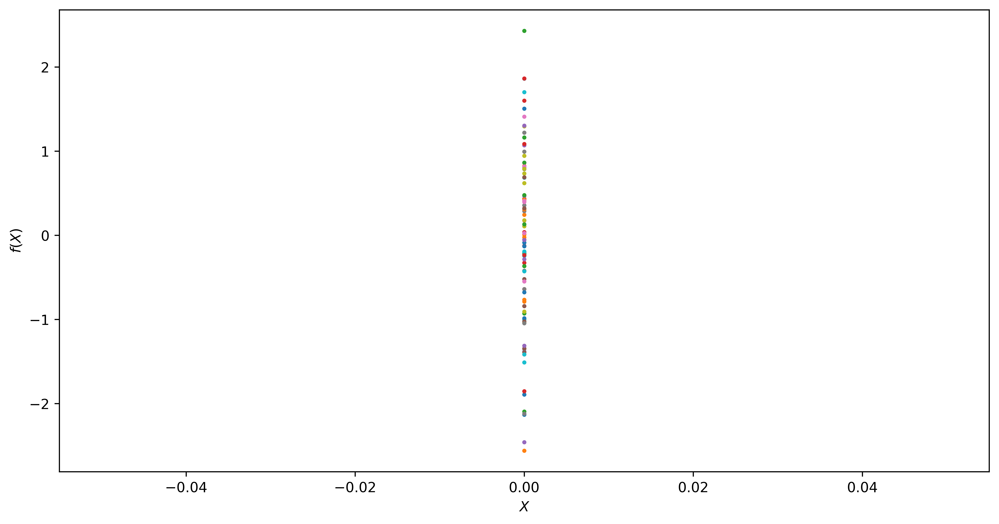

In [26]:
n = 1  # n number of independent 1-D gaussian
m = 100  # m points in 1-D gaussian
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, "o", linewidth=1, markersize=1, markeredgewidth=2)
plt.xlabel("$X$")
plt.ylabel("$f(X)$")
plt.show()

It's clear that the vector $X_1$ is Gaussian. It looks like we did nothing but vertically plot the vector points $X_1$.
Next, we can plot multiple **independent** Gaussian in the $X-Y$ coordinates. For example, put vector $X_1$ at at $X = 0$ and another vector $X_2$ at at $X = 1$.

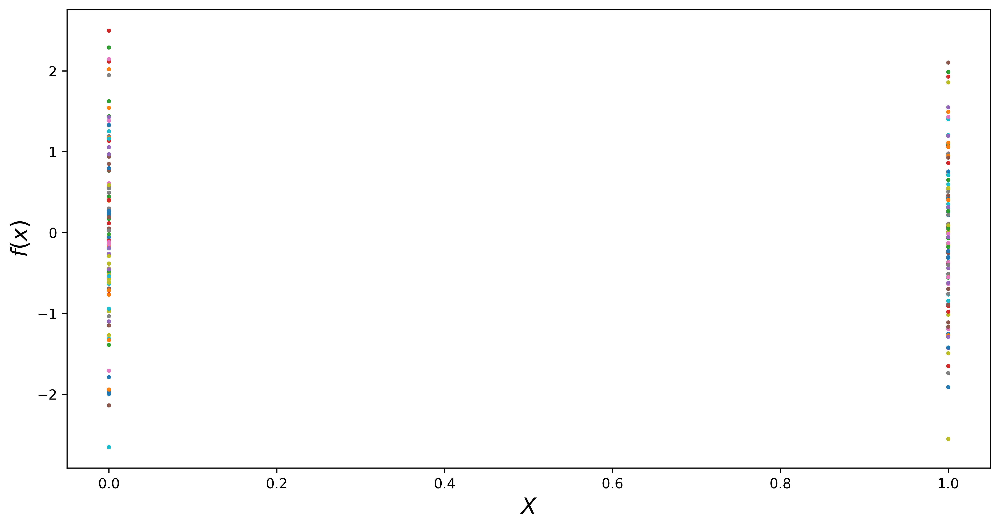

In [27]:
n = 2
m = 100
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, "o", linewidth=1, markersize=1, markeredgewidth=2)

plt.xlabel(r"$X$", fontsize=16)
plt.ylabel(r"$f(x)$", fontsize=16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig("2gaussian")

Keep in mind that both vecotr $X_1$ and $X_2$ are Gaussian.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2gaussian.png?raw=1" width="500"/>

Let's do something interesting. Let's connect points of $X_1$ and $X_2$ by lines. For now, we only generate 10 random points for $X_1$ and $X_2$, and then join them up as 10 lines. Keep in mind, these random generated 10 points are Gaussian.

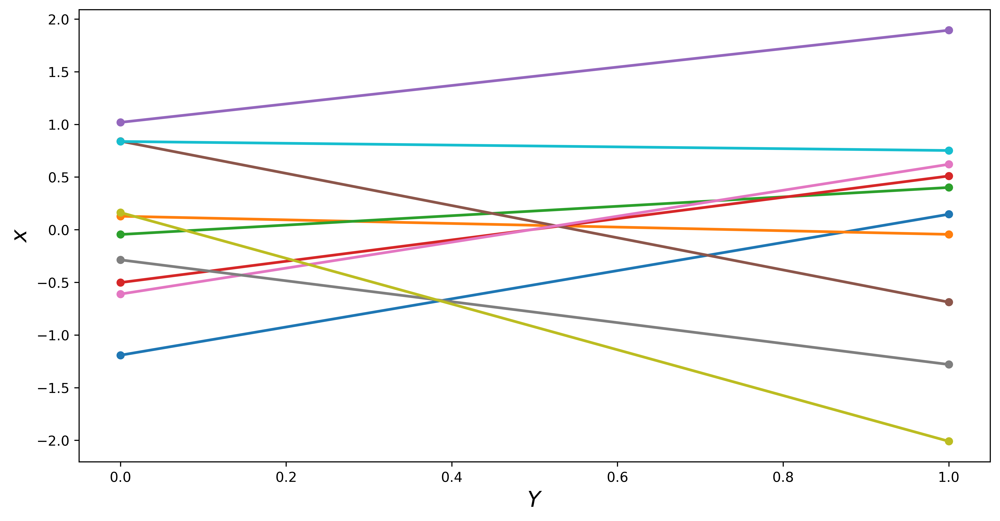

In [28]:
n = 2
m = 10
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, "-o", linewidth=2, markersize=4, markeredgewidth=2)
plt.xlabel(r"$X$", fontsize=16)
plt.ylabel(r"$Y$", fontsize=16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig("random_x1_x2")

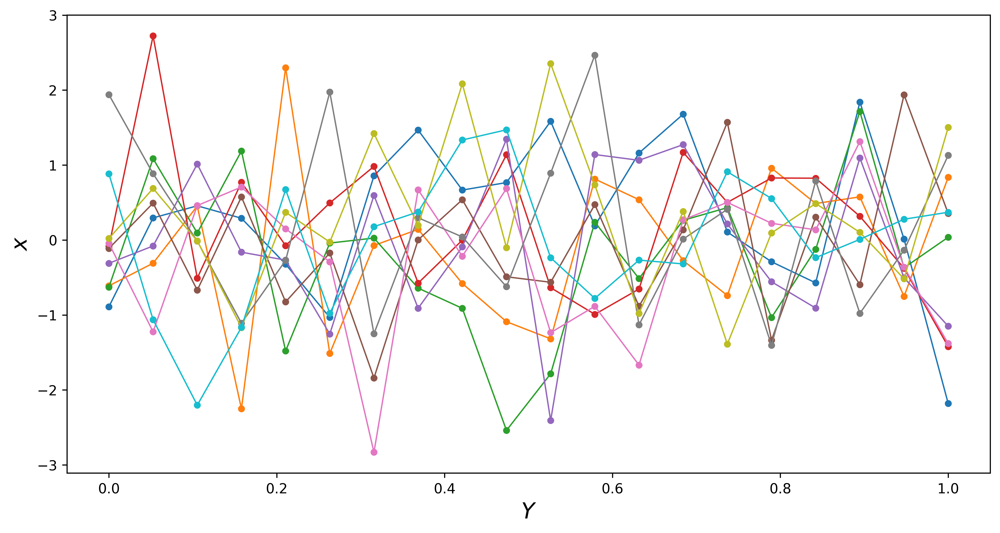

In [29]:
n = 20
m = 10
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, "-o", linewidth=1, markersize=3, markeredgewidth=2)

plt.xlabel(r"$Y$", fontsize=16)
plt.ylabel(r"$x$", fontsize=16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig("random_x1_x20")

What we actually did is smpling piecewise-linear functions, but they look too noisy, whis is the result of independent sampling of points. 

## Kernels

We want to smooth the sampling functions by defining the covariance functions: we want closer points to be more correlated to eachother. 

**Kernel Trick:** If an algorithm is defined solely in terms of inner products in input space then it can be lifted into feature space by replacing occurrences of those inner products by $k(x,\ x^\prime)$; we call $k(\bullet,\bullet)$ a kernel function.

A popular covariance function (aka kernel function) is squared exponential kernal, also called the radial basis function (RBF) kernel or Gaussian kernel, defined as

$$ cov(x_i, x_j)=\exp\left(-~\frac{(x_i-x_j)^2}{2}\right)$$

Let's re-plot 20 independent Gaussian and connecting points in order by lines. Instead of generating 20 independent Gaussian before, we do the plot of a $20-D$ Gaussian with a identity convariance matrix.

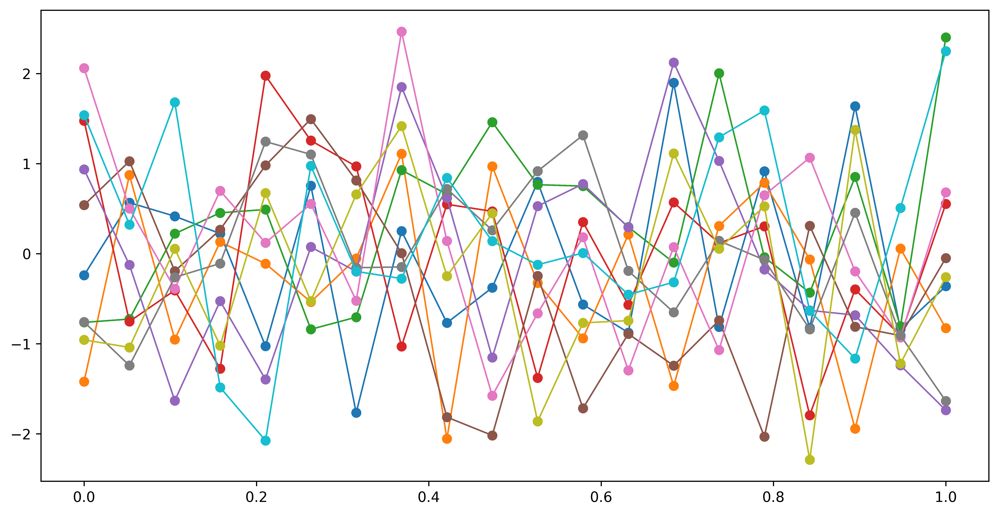

In [30]:
n = 20
m = 10

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, cov, m).T

plt.clf()

# plt.plot(Xshow, f_prior, '-o')
Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

for i in range(m):
    plt.plot(Xshow, f_prior, "-o", linewidth=1)

# plt.title('10 samples of the 20-D gaussian prior')
# plt.show()
plt.savefig("20d_gaussian_prior")

We got exactly the same plot as expected. Now let's kernelizing our funcitons by use the RBF as our convariace.

In [41]:
# Define the kernel
def kernel(a, b):
    return np.exp(
        -0.5
        * (
            np.tile((a**2).reshape(-1, 1), a.shape[0])
            + np.tile((b**2).reshape(-1, 1), b.shape[0]).T
            - 2 * a @ b.T
        )
    )

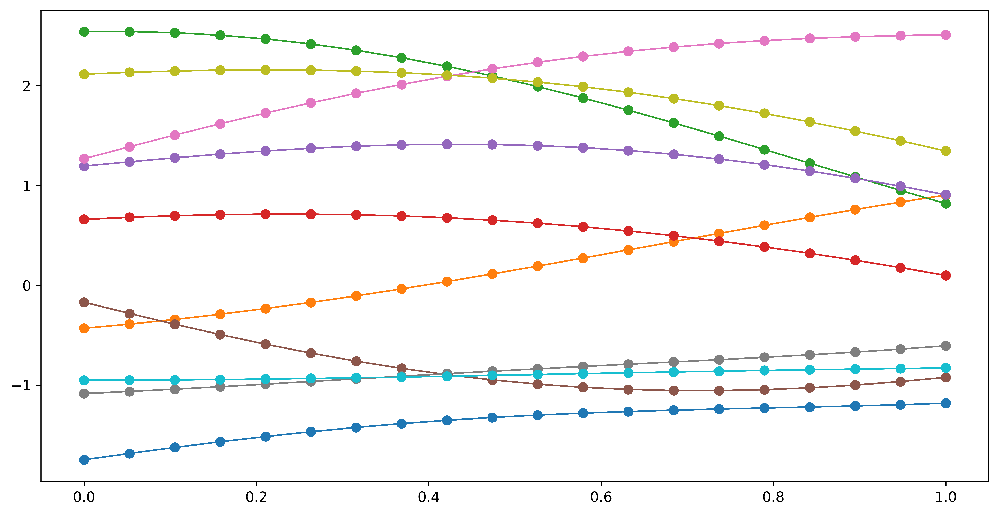

In [42]:
n = 20
m = 10

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

K_ = kernel(Xshow, Xshow)  # k(x_star, x_star)

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, K_, m).T
plt.clf()

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

for i in range(m):
    plt.plot(Xshow, f_prior, "-o", linewidth=1)

# plt.title('10 samples of the 20-D gaussian kernelized prior')
# plt.show()
plt.savefig("20d_gaussian_kernel_prior")

# They are smoother now! 

Let's play with kernel.

In [53]:
def kernel(a, b):
    return 20 * np.exp(
        -0.5
        * (
            np.tile((a**2).reshape(-1, 1), a.shape[0])
            + np.tile((b**2).reshape(-1, 1), b.shape[0]).T
            - 2 * a @ b.T
        )
    )

<Figure size 7200x3600 with 0 Axes>

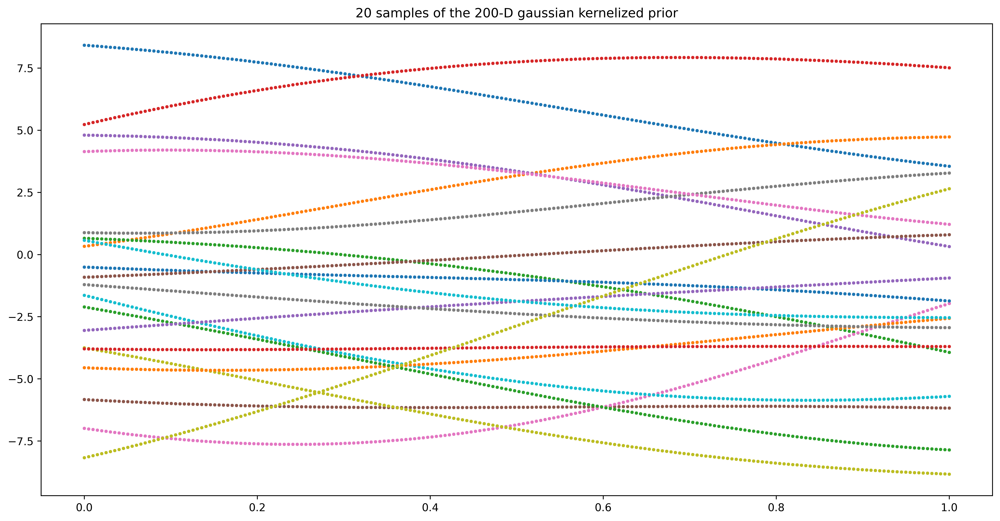

In [54]:
n = 200
m = 20

Xshow = np.linspace(0, 1, n).reshape(-1, 1)

K_ = kernel(Xshow, Xshow)  # k(x_star, x_star)

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, K_, m).T

plt.clf()
# plt.plot(Xshow, f_prior, '-o')
Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

plt.figure(figsize=(16, 8))
for i in range(m):
    plt.plot(Xshow, f_prior, "o", linewidth=1, markersize=2, markeredgewidth=1)

plt.title("20 samples of the 200-D gaussian kernelized prior")
# plt.axis([0, 1, -3, 3])
plt.show()
# plt.savefig('priorT.png', bbox_inches='tight', dpi=300)

As we can see above, when we increase the dimension of Gaussian to infinity, we can sample all the possible points in our region of interest.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2points_covariance.gif?raw=1" width="600"/>
      	  
<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/4points_covariance.gif?raw=1" width="600"/>

How to sample from non-iid gaussians?

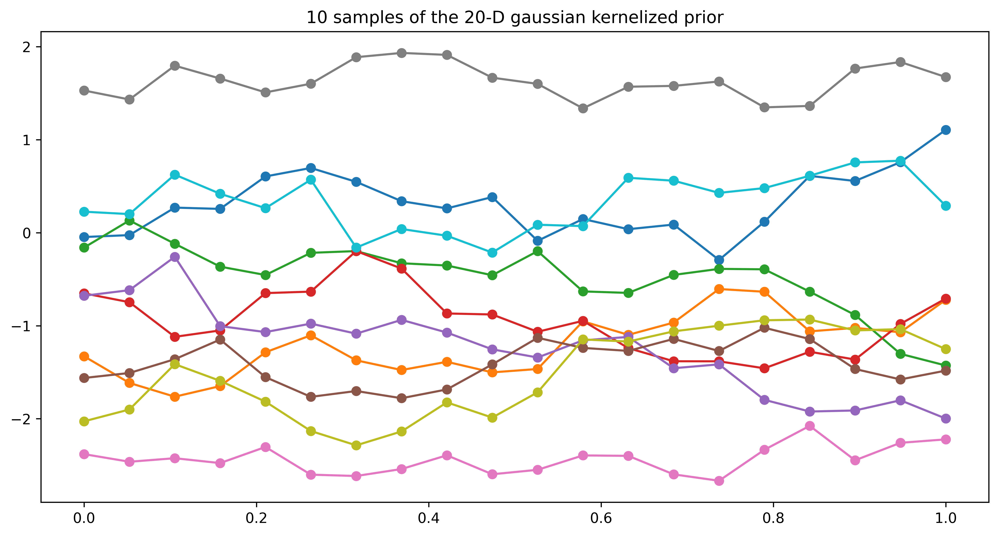

In [35]:
n = 20
m = 10

Xshow = np.linspace(0, 1, n).reshape(
    -1, 1
)  # n number test points in the range of (0, 1)

K_ = kernel(Xshow, Xshow)

...

plt.clf()
plt.plot(Xshow, f_prior, "-o")
plt.title("10 samples of the 20-D gaussian kernelized prior")
plt.show()

## Posterior update

The function is modeled by a multivarable Gaussian as

$$p(\mathbf{f} \, \lvert\, \mathbf{X}) = \mathcal{N}(\mathbf{f} \, \lvert\, \boldsymbol\mu, \mathbf{K})$$

where $\mathbf{f} = (f(\mathbf{x}_1),...,f(\mathbf{x}_n))$, $\boldsymbol\mu = (m(\mathbf{x}_1),...,m(\mathbf{x}_n))$ and $K_{ij} = \kappa(\mathbf{x}_i,\mathbf{x}_j)$. $m$ is the mean function and it is common to use $m(\mathbf{x}) = 0$ as GPs are flexible enough to model the mean arbitrarily well. $\kappa$ is a positive definite *kernel function* or *covariance function*. 

**NOTE:** by choosing specific kernel, we introduce **prior distribution over functions**. Trajectories (aka realizations) on which density of prior is not equal to zero are still plausible, but with lower probability.

So, we have observations, and we have estimated functions $\mathbf{f}$ with these observations. Now say we have some new points $\mathbf{X}_*$ where we want to predict $f(\mathbf{X}_*)$.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/mvn.png?raw=1" width="250"/>

The joint distribution of $\mathbf{f}$ and $\mathbf{f}_*$ can be modeled as:

$$ \begin{pmatrix}\mathbf{f} \\ \mathbf{f}_*\end{pmatrix} \sim\mathcal{N}\left(\begin{pmatrix}m(\mathbf{X})\\ m(\mathbf{X}_*)\end{pmatrix}, \begin{pmatrix}\mathbf{K} & \mathbf{K}_* \\ \mathbf{K}_*^T & \mathbf{K}_{**}\end{pmatrix}\right) $$

where $\mathbf{K}=\kappa(\mathbf{X}, \mathbf{X})$, $\mathbf{K}_* = \kappa(\mathbf{X}, \mathbf{X}_*)$ and $\mathbf{K}_{**}=\kappa(\mathbf{X}_*, \mathbf{X}_*)$. And $\begin{pmatrix}m(\mathbf{X})\\ m(\mathbf{X}_*)\end{pmatrix} = \mathbf{0}$

This is modeling a joint distribution $p(\mathbf{f}, \mathbf{f}_* \, \vert \, \mathbf{X}, \mathbf{X}_*)$, but we want the conditional distribution over $\mathbf{f}_*$ only, which is $p(\mathbf{f}_* \, \vert \, \mathbf{f}, \mathbf{X}, \mathbf{X}_*)$. 

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/mvn_theorem.png?raw=1" width="420"/>

$$\mathbf{f}_* \, \vert \, \mathbf{f}, \mathbf{X}, \mathbf{X}_* \sim \mathcal{N} (\mathbf{K}_*^T \mathbf{K}^{-1} \mathbf{f}, \: \mathbf{K}_{**}-\mathbf{K}_*^T \mathbf{K}^{-1} \mathbf{K}_*) $$

It is realistic modelling situations that we do not have access to function values themselves, but only noisy versions thereof $y = f(x) + \epsilon$. Assuming additive independent identically distributed Gaussian noise with
variance $\sigma_n^2$, the prior on the noisy observations becomes $cov(y) = \mathbf{K} + \sigma_n^2\mathbf{I}$. The joint distribution of the observed target values and the function values at the test locations under the prior as [1]

$$ \begin{pmatrix}\mathbf{y} \\ \mathbf{f}_*\end{pmatrix} \sim\mathcal{N}\left(\mathbf{0}, \begin{pmatrix}\mathbf{K} + \sigma_n^2\mathbf{I} & \mathbf{K}_* \\ \mathbf{K}_*^T & \mathbf{K}_{**}\end{pmatrix}\right) $$

$$\mathbf{\bar{f}_*} \, \vert \, \mathbf{X}, \mathbf{y}, \mathbf{X}_* \sim \mathcal{N} \left(\mathbf{\bar{f}_*}, cov(\mathbf{f}_*)\right) $$

where,
$$\mathbf{\bar{f}_*} \overset{\Delta}{=} \mathbb{E} [\mathbf{\bar{f}_*} \, \vert \, \mathbf{X}, \mathbf{y}, \mathbf{X}_*] = \mathbf{K}_*^T [\mathbf{K} + \sigma_y^2\mathbf{I}]^{-1} \mathbf{y} $$

$$cov(\mathbf{f}_*) = \mathbf{K}_{**} - \mathbf{K}_*^T [\mathbf{K} + \sigma_y^2\mathbf{I}]^{-1} \mathbf{K}_* $$

## Implementation

We do the regression example between -5 and 5. The observation data points (traing dataset) are generated from a uniform distribution between -5 and 5. The functions will be evaluated at `n` evenly spaced points between -5 and 5. We do this to show a continuous function for regression in our region of interest [-5, 5]. This is a simple example to do GP regression. It assumes a zero mean GP Prior. The code borrows heavily from Dr. Nando de Freitas’ Gaussian processes for nonlinear regression [lecture](https://youtu.be/4vGiHC35j9s) [6].

The algorithm executed follows

The textbook [GPML](http://gaussianprocess.org/gpml/chapters/RW.pdf), P19. [1]

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/gp1.png?raw=1" width="600"/>



In [36]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

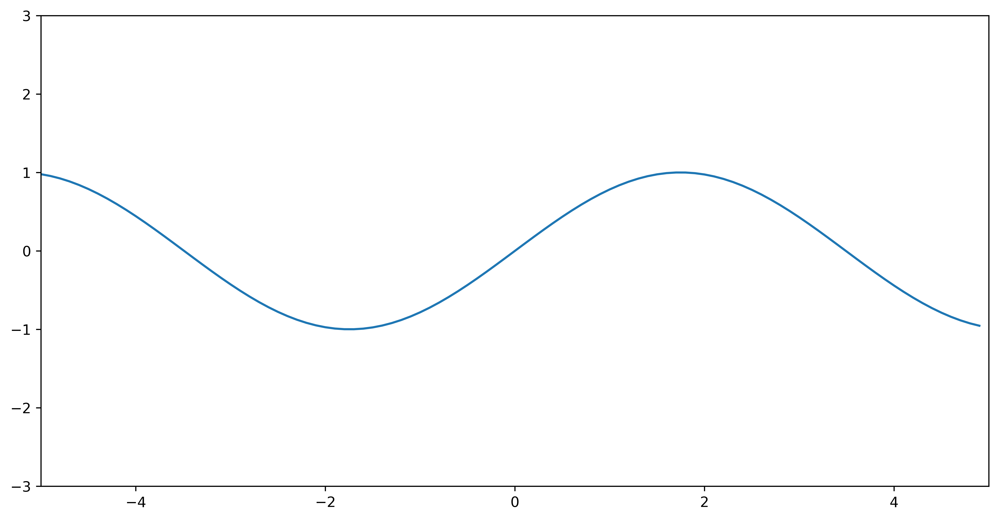

In [37]:
# This is the true unknown function we are trying to approximate
f = lambda x: np.sin(0.9 * x).flatten()
# f = lambda x: (0.25*(x**2)).flatten()
x = np.arange(-5, 5, 0.1)

plt.plot(x, f(x))
plt.axis([-5, 5, -3, 3])
plt.show()

In [38]:
# Define the kernel
def kernel(a, b):
    ...

We use a general Squared Exponential Kernel, also called Radial Basis Function Kernel or Gaussian Kernel:

$$
\kappa(\mathbf{x}_i,\mathbf{x}_j) = \sigma_f^2 \exp(-\frac{1}{2l^2}
  (\mathbf{x}_i - \mathbf{x}_j)^T
  (\mathbf{x}_i - \mathbf{x}_j))
$$

where $\sigma_f$ and $l$ are hyperparameters. More information about the hyperparameters can be found after the codes.

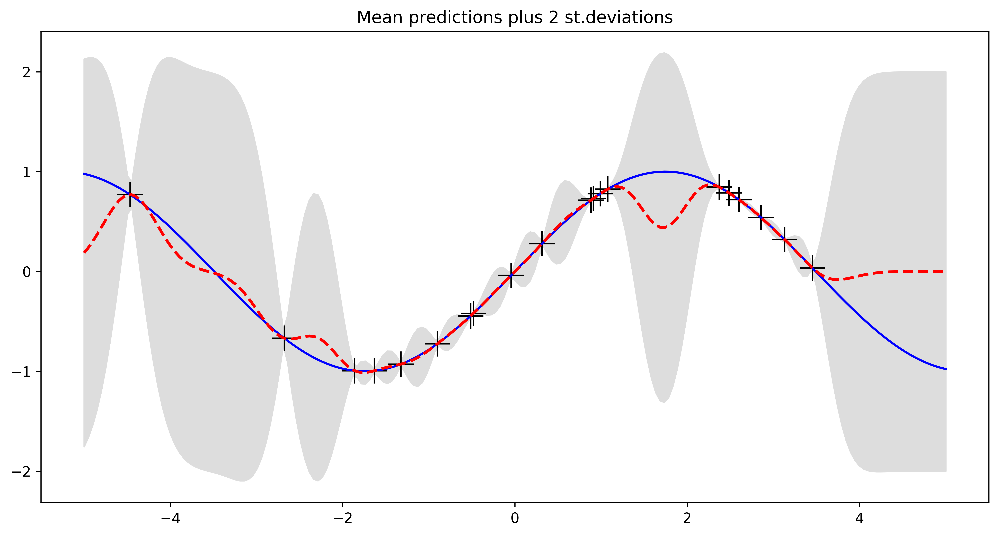

In [39]:
# Sample some input points and noisy versions of the function evaluated at
# these points.
N = 20  # number of existing observation points (training points).
n = 200  # number of test points.
s = 0.00005  # noise variance.

X = np.random.uniform(-5, 5, size=(N, 1))  # N training points
y = f(X) + s * np.random.randn(N)

K = ...
L = ...

# points we're going to make predictions at.
Xtest = np.linspace(-5, 5, n).reshape(-1, 1)

# compute the mean at our test points.
Lk = ...
mu = ...

# compute the variance at our test points.
K_ = ...
s2 = ...
s = ...

# PLOTS:
plt.figure(1)
plt.clf()
plt.plot(X, y, "k+", ms=18)
plt.plot(Xtest, f(Xtest), "b-")
plt.gca().fill_between(Xtest.flat, mu - 2 * s, mu + 2 * s, color="#dddddd")
plt.plot(Xtest, mu, "r--", lw=2)
# plt.savefig('predictive.png', bbox_inches='tight', dpi=300)
plt.title("Mean predictions plus 2 st.deviations")
plt.show()
# plt.axis([-5, 5, -3, 3])

<Figure size 7200x3600 with 0 Axes>

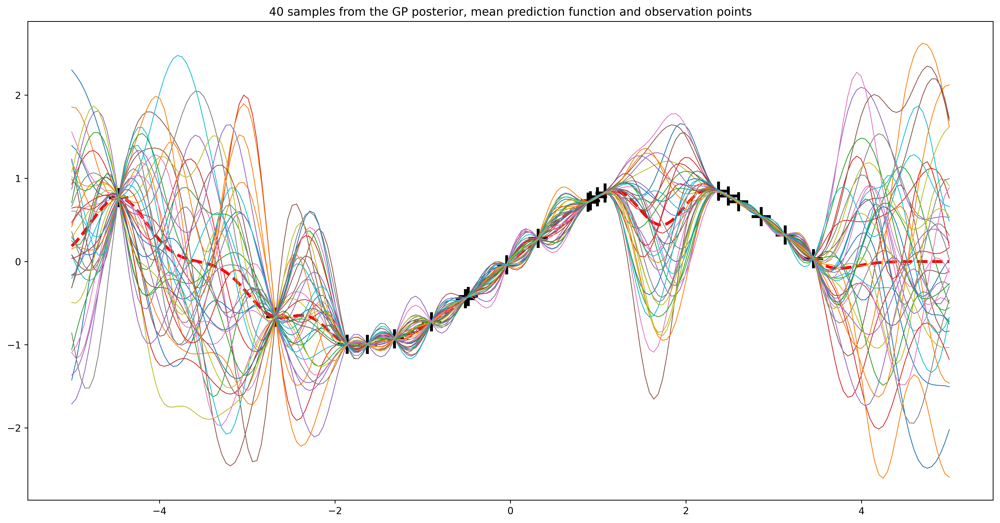

In [40]:
# draw samples from the posterior at our test points.
...

plt.figure(3)
plt.clf()
plt.figure(figsize=(18, 9))
plt.plot(X, y, "k+", markersize=20, markeredgewidth=3)
plt.plot(Xtest, mu, "r--", linewidth=3)
plt.plot(Xtest, f_post, linewidth=0.8)
plt.title(
    "40 samples from the GP posterior, mean prediction function and observation points"
)
plt.show()
# plt.axis([-5, 5, -3, 3])
# plt.savefig('post.png', bbox_inches='tight', dpi=600)

## Real Gaussian Process

In real life, the most important part of GP implementation relates to the choice of kernel.

The general RBF kernel:

$$
\kappa(\mathbf{x}_i,\mathbf{x}_j) = \sigma_f^2 \exp(-\frac{1}{2l^2}
  (\mathbf{x}_i - \mathbf{x}_j)^T
  (\mathbf{x}_i - \mathbf{x}_j))\tag{6}
$$

where $\sigma_f$ and $l$ are hyperparameters. [7]

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/hyperparameter.png?raw=1" width="700"/>

  The proper hyperparameters (for RBF, $\mathbf{\theta} = [\sigma_f, l]$) are determined by the `Maximum Likelihood Estimate` as:  

$$ \mathbf{\theta^*} = \arg\max\limits_{\theta} \log p(y \, \vert \, \mathbf{X}, \mathbf{\theta}) $$

Thus, the more general equation of predicting on test points given the observed data and the optimized hyper-parameters is [11]:  

$$\mathbf{\bar{f}_*} \, \vert \, \mathbf{X}, \mathbf{y}, \mathbf{X}_*,  \mathbf{\theta} \sim \mathcal{N} \left(\mathbf{\bar{f}_*}, cov(\mathbf{f}_*)\right) $$


The kernel functions are selected depending on the specific tasks. 

### GP Packages

There are several packages or frameworks available to conduct Gaussian Process Regression. In this section, I will summarize my initial impression after trying several of them written in Python.

Scikit-learn provides a `GaussianProcessRegressor` for implementing [GP regression models](http://scikit-learn.org/stable/modules/gaussian_process.html#gaussian-process-regression-gpr). It can be configured with [pre-defined kernels and user-defined kernels](http://scikit-learn.org/stable/modules/gaussian_process.html#gp-kernels). Kernels can also be composed. The squared exponential kernel is the `RBF` kernel in scikit-learn. The `RBF` kernel only has a `length_scale` parameter which corresponds to the $l$ parameter above. To have a $\sigma_f$ parameter as well, we have to compose the `RBF` kernel with a `ConstantKernel`.

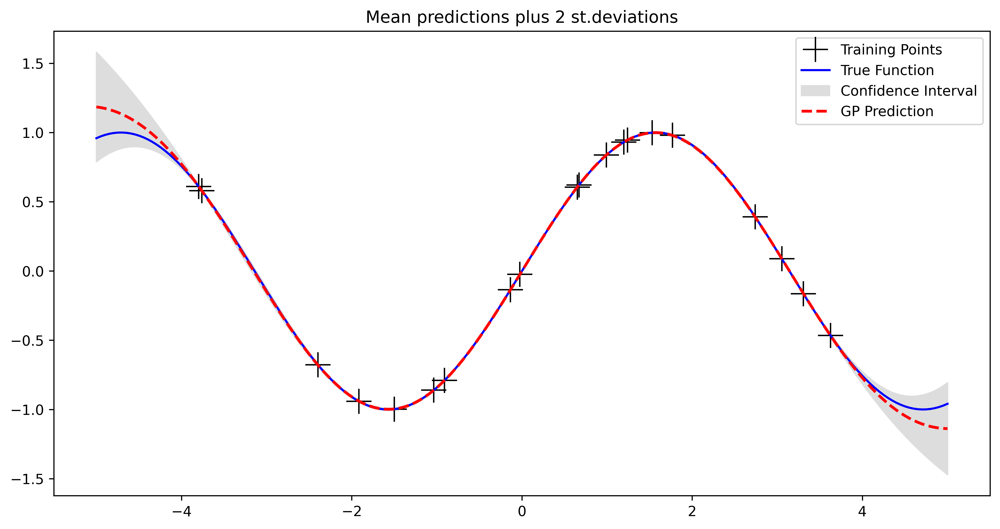

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C


# # Define the function
def f(x):
    return np.sin(x)


# # Parameters
N = 20  # Number of training points
n = 200  # Number of test points
s = 0.00005  # Noise variance

# # Training data
X = np.random.uniform(-5, 5, size=(N, 1))
y = f(X) + s * np.random.randn(N, 1)

# Kernel and Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
gp = GaussianProcessRegressor(kernel=kernel, alpha=s, n_restarts_optimizer=10)
gp.fit(X, y)

# Test data
Xtest = np.linspace(-5, 5, n).reshape(-1, 1)

# Predict mean and standard deviation
mu, std = gp.predict(Xtest, return_std=True)

# Plot
plt.figure(1)
plt.clf()
plt.plot(X, y, "k+", ms=18, label="Training Points")
plt.plot(Xtest, f(Xtest), "b-", label="True Function")
plt.gca().fill_between(
    Xtest.flat, mu - 2 * std, mu + 2 * std, color="#dddddd", label="Confidence Interval"
)
plt.plot(Xtest, mu, "r--", lw=2, label="GP Prediction")
plt.title("Mean predictions plus 2 st.deviations")
plt.legend()
plt.show()

GPR is computationally expensive in high dimensional spaces (features more than a few dozens) due to the fact it uses the whole samples/features to do the predictions. The more observations, the more computations are needed for predictions. A package that includes state-of-the-art algorithm implementations is preferred for efficient implementation of complex GPR tasks.

One of the most well-known GP frameworks is [GPy](https://sheffieldml.github.io/GPy/). GPy has been developed pretty maturely with well-documented explanations. GPy uses NumPy to perform all its computations. For tasks that don't require heavy computations and very up-to-date algorithm implementations, GPy is sufficient and the more stable.

In [19]:
# !pip install GPy


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


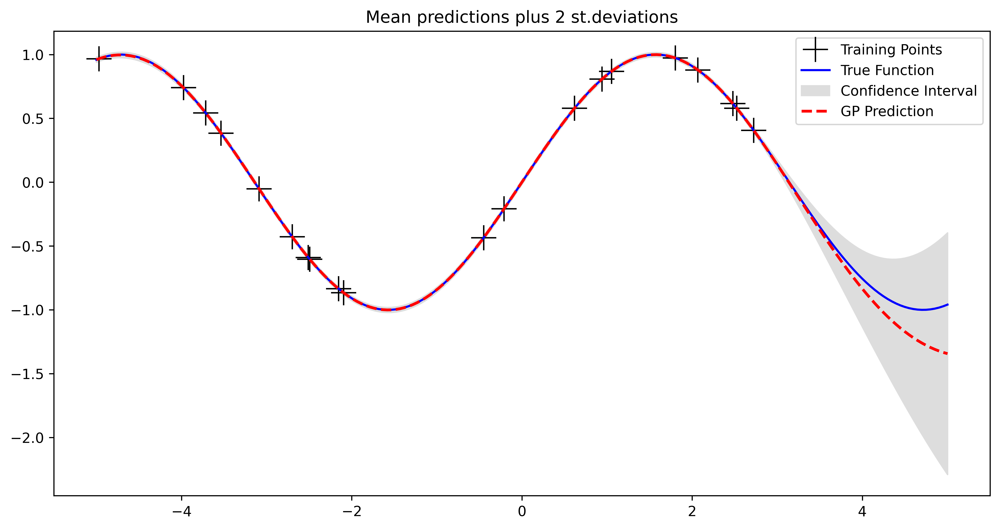

In [46]:
import numpy as np
import GPy
import matplotlib.pyplot as plt


# Define the function
def f(x):
    return np.sin(x)


# Parameters
N = 20  # Number of training points
n = 200  # Number of test points
s = 0.00005  # Noise variance

# Training data
X = np.random.uniform(-5, 5, size=(N, 1))
y = f(X) + s * np.random.randn(N, 1)

# Kernel and Gaussian Process
kernel = GPy.kern.RBF(input_dim=1, variance=1.0, lengthscale=1.0)
gp = GPy.models.GPRegression(X, y, kernel)
gp.Gaussian_noise.variance = s  # Set noise variance
gp.Gaussian_noise.variance.fix()  # Fix noise during optimization
gp.optimize(messages=False)

# Test data
Xtest = np.linspace(-5, 5, n).reshape(-1, 1)

# Predict mean and variance
mu, var = gp.predict(Xtest)
std = np.sqrt(var)

# Plot
plt.figure(1)
plt.clf()
plt.plot(X, y, "k+", ms=18, label="Training Points")
plt.plot(Xtest, f(Xtest), "b-", label="True Function")
plt.gca().fill_between(
    Xtest.flat,
    (mu - 2 * std).flat,
    (mu + 2 * std).flat,
    color="#dddddd",
    label="Confidence Interval",
)
plt.plot(Xtest, mu, "r--", lw=2, label="GP Prediction")
plt.title("Mean predictions plus 2 st.deviations")
plt.legend()
plt.show()

For bigger computation required GPR tasks, GPU acceleration are especially preferred. [GPflow](https://www.gpflow.org/) origins from GPy, and much of the interface is similar. GPflow leverages **TensorFlow** as its computational backend. More technical difference between GPy and GPflow frameworks is [here](https://gpflow.readthedocs.io/en/master/intro.html#what-s-the-difference-between-gpy-and-gpflow).

[GPyTorch](https://gpytorch.ai/) is another framework that provides GPU acceleration through **PyTorch**. It contains very up-to-date GP algorithms. Similar to GPflow, GPyTorch provides automatic gradients. So complex models such as embedding deep NNs in GP models can be easier developed.

### Bonus task 19: 
Suppose that $x=(x_0, x_1)^T \sim N(\mu, \Sigma)$. Find the distribution of $(a, b)^T$ of line $y=ax+b$ passing through points $(0, x_0)$and $(1, x_1)$. Derive the distribution and it's parameters, implement and check if works.

### Bonus task 20: 
Same, but for $x=(x_0, x_1, x_2)^T$ and coefficients of quadratic polynomials passing through all three points $(0, x_1), (1, x_1), (2, x_2)$.

### Bonus task 21: 
Same, but for $x=(x_0, x_1,\dots x_{n-1})^T$ and coefficients of polynomials with degree $n$ passing through all $n$ points $(i, x_i)$.

----
Adopted from [this notebook](https://colab.research.google.com/github/jwangjie/Gaussian-Processes-Regression-Tutorial/blob/master/gpr_tutorial.ipynb) [Jie Wang](mailto:jie.wang@queensu.ca), [Offroad Robotics](https://offroad.engineering.queensu.ca/), Queen's University, Kingston, Canada
